
## Use AFragmenter to split full-length AF2 model into smaller domains

May be useful to split large model into smaller domains to analyse each domain separately.

Original publication on github: https://github.com/sverwimp/AFragmenter

My own fork to make modification (`Meng` branch): https://github.com/meng-yx/AFragmenter.git 

┏━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┓
┃ Domain ┃ Number of Residues ┃       Chopping ┃
┡━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━┩
│ 1      │                825 │ 1-393_709-1140 │
│ 2      │                315 │        394-708 │
└────────┴────────────────────┴────────────────┘


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

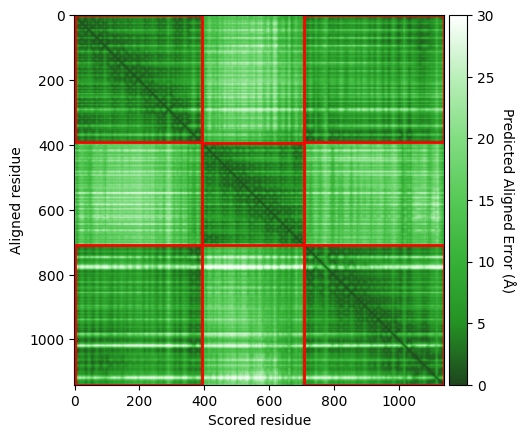

In [ ]:
import sys

from afragmenter import AFragmenter, fetch_afdb_data

pae, structure = fetch_afdb_data('Q16531')
fragmenter = AFragmenter(pae) # Or bring your own files: a = AFragmenter('filename.json')
#fragmenter.plot_pae()

fragmenter = AFragmenter(pae)
result = fragmenter.cluster(resolution=0.4, objective_function="modularity", min_size=20, min_avg_pae=15)
result.plot_result()
result.print_result()
result.py3Dmol(structure, width=400, height=400)

┏━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┓
┃ Domain ┃ Number of Residues ┃       Chopping ┃
┡━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━┩
│ 1      │                 12 │           1-12 │
│ 2      │                296 │ 13-171_178-314 │
│ 3      │                  6 │        172-177 │
└────────┴────────────────────┴────────────────┘


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

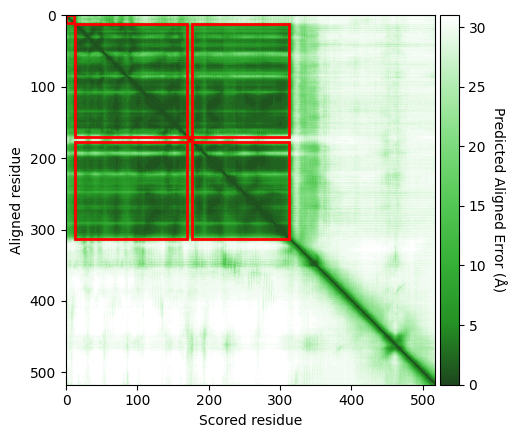

In [ ]:
# The default workflow in AFragmenter uses find_cluster_intervals() to break down the clusters into smaller intervals
# A interval is defined as a continuous segment of residues that are part of the same cluster.
# This results in small loops being excluded from a domain (e.g. the activation loop of a kinase).

from afragmenter import AFragmenter, fetch_afdb_data

pae, structure = fetch_afdb_data('Q9Y572')
fragmenter = AFragmenter(pae) # Or bring your own files: a = AFragmenter('filename.json')
#fragmenter.plot_pae()

fragmenter = AFragmenter(pae)
result = fragmenter.cluster(resolution=0.4, objective_function="modularity", min_size=1, min_avg_pae=15)

result.plot_result()
result.print_result()
result.py3Dmol(structure, width=400, height=400)

┏━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━┓
┃ Domain ┃ Number of Residues ┃ Chopping ┃
┡━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━┩
│ 1      │                302 │   13-314 │
└────────┴────────────────────┴──────────┘


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

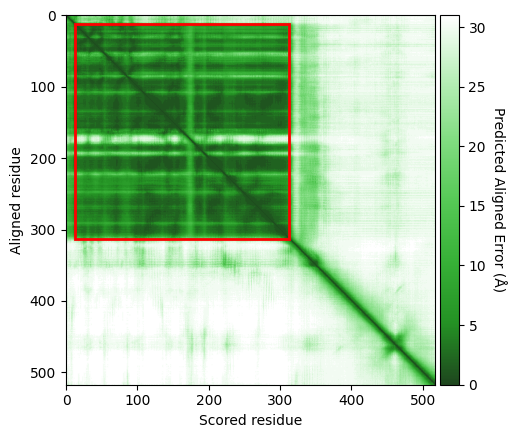

In [ ]:
#-------- Set collapse_intervals to True to prevent small loops from being excluded -------

from afragmenter import AFragmenter, fetch_afdb_data
from AFragmenter.afragmenter.intervals import remove_enclosed_clusters


pae, structure = fetch_afdb_data('Q9Y572')
fragmenter = AFragmenter(pae) # Or bring your own files: a = AFragmenter('filename.json')
#fragmenter.plot_pae()

fragmenter = AFragmenter(pae)
result = fragmenter.cluster(resolution=0.4, objective_function="modularity", min_size=20, min_avg_pae=15, collapse_intervals=True)

result.plot_result()
result.print_result()
result.py3Dmol(structure, width=400, height=400)

┏━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓
┃ Domain ┃ Number of Residues ┃  Chopping ┃
┡━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩
│ 1      │                604 │    19-622 │
│ 2      │                297 │   423-719 │
│ 3      │                214 │   720-933 │
│ 4      │                 67 │ 1042-1108 │
└────────┴────────────────────┴───────────┘


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

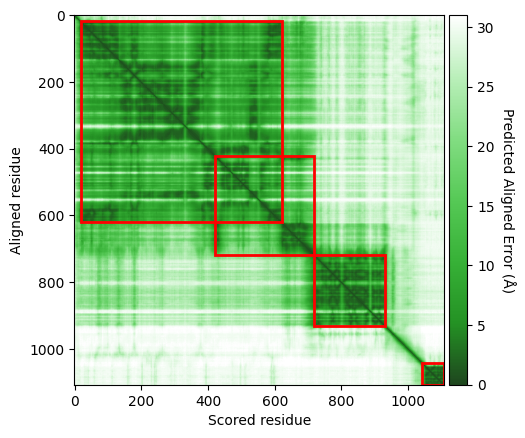

In [4]:
# However, with collapse_intervals=True, clusters may overlap. 
# We need to use max_overlap to prevent this.

from afragmenter import AFragmenter, fetch_afdb_data
from AFragmenter.afragmenter.intervals import remove_enclosed_clusters

pae, structure = fetch_afdb_data('Q12965')
fragmenter = AFragmenter(pae) # Or bring your own files: a = AFragmenter('filename.json')
#fragmenter.plot_pae()

fragmenter = AFragmenter(pae)
result = fragmenter.cluster(resolution=0.4, objective_function="modularity", min_size=20, min_avg_pae=15, collapse_intervals=True)

result.plot_result()
result.print_result()
result.py3Dmol(structure, width=400, height=400)

┏━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓
┃ Domain ┃ Number of Residues ┃  Chopping ┃
┡━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩
│ 1      │                604 │    19-622 │
│ 2      │                 97 │   623-719 │
│ 3      │                214 │   720-933 │
│ 4      │                 67 │ 1042-1108 │
└────────┴────────────────────┴───────────┘


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

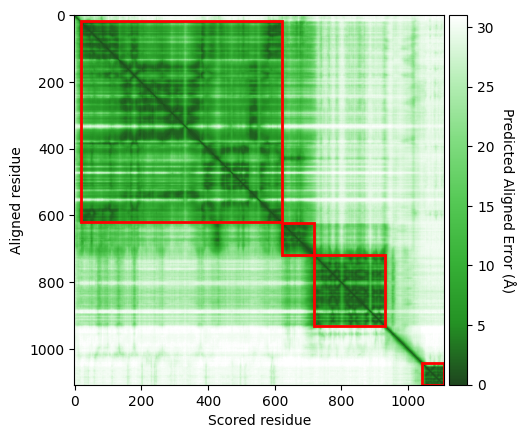

In [7]:
# Setting max_overlap lets you control the maximum allowed overlapping residues between domains.
# If the overlap exceeds max_overlap, the algorithm considers four ways to resolve it, then chooses the one minimizing the total weighted (by cluster size) mean PAE:
#   1. Assign the overlap to domain 1 only.
#   2. Assign the overlap to domain 2 only.
#   3. Merge both domains into one.

from afragmenter import AFragmenter, fetch_afdb_data

pae, structure = fetch_afdb_data('Q12965')
fragmenter = AFragmenter(pae) # Or bring your own files: a = AFragmenter('filename.json')
#fragmenter.plot_pae()

fragmenter = AFragmenter(pae)
result = fragmenter.cluster(resolution=0.4, objective_function="modularity", min_size=20, min_avg_pae=15, collapse_intervals=True, max_overlap=40)

result.plot_result()
result.print_result()
result.py3Dmol(structure, width=400, height=400)


┏━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━┓
┃ Domain ┃ Number of Residues ┃ Chopping ┃
┡━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━┩
│ 1      │                275 │   51-325 │
│ 2      │                293 │  326-618 │
└────────┴────────────────────┴──────────┘


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

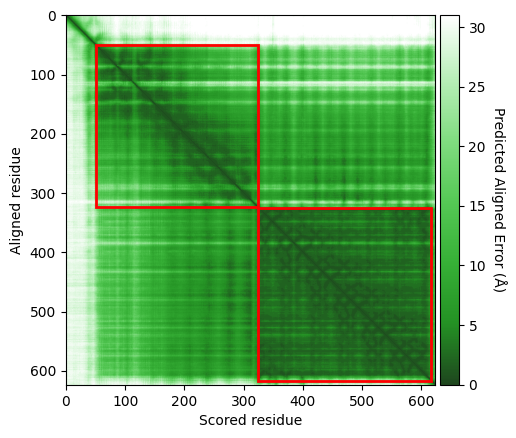

In [ ]:
from afragmenter import AFragmenter, fetch_afdb_data

pae, structure = fetch_afdb_data('Q14145')
fragmenter = AFragmenter(pae) # Or bring your own files: a = AFragmenter('filename.json')
#fragmenter.plot_pae()

fragmenter = AFragmenter(pae)
result = fragmenter.cluster(resolution=0.4, objective_function="modularity", min_size=30, min_avg_pae=15, collapse_intervals=True, max_overlap=40)

result.plot_result()
result.print_result()
result.py3Dmol(structure, width=400, height=400)

┏━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┓
┃ Domain ┃ Number of Residues ┃  Chopping ┃
┡━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━┩
│ 1      │                 34 │      1-34 │
│ 2      │                129 │    35-163 │
│ 3      │                580 │  692-1271 │
│ 4      │                100 │ 1272-1371 │
│ 5      │                233 │ 1660-1892 │
└────────┴────────────────────┴───────────┘


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

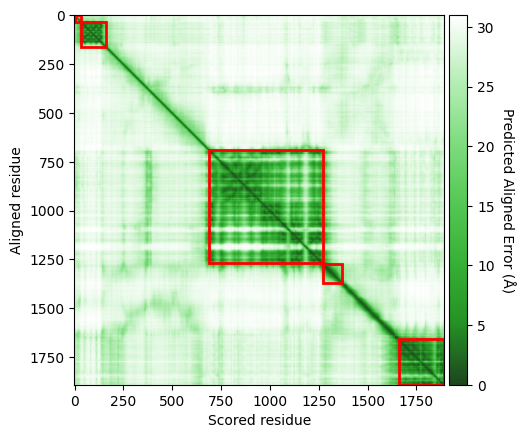

In [8]:
from afragmenter import AFragmenter, fetch_afdb_data

pae, structure = fetch_afdb_data('Q8IZT6')
fragmenter = AFragmenter(pae) # Or bring your own files: a = AFragmenter('filename.json')
#fragmenter.plot_pae()

fragmenter = AFragmenter(pae)
result = fragmenter.cluster(resolution=0.4, objective_function="modularity", min_size=30, min_avg_pae=15, collapse_intervals=True, max_overlap=40)

result.plot_result()
result.print_result()
result.py3Dmol(structure, width=400, height=400)

In [10]:
#---------- Function to convert result to domain DataFrame ----------
import numpy as np
import pandas as pd

from afragmenter.intervals import calculate_cluster_average_pae

def result_to_domain_df(result, include_nondomains=True):
    """
    Build a DataFrame with columns: domain, n_residues, chopping, mean_pae.
    Non-domain regions are labeled with negative domain ids if include_nondomains=True.
    """
    pae = result.pae_matrix
    n_res = pae.shape[0]
    intervals = result.cluster_intervals  # {cluster_id: [(start, end), ...]} 0-based
    rows = []

    # Helper: flatten to compute a sort key
    def min_start(segs):
        return min(s for s, e in segs)

    # Add domain rows (positive ids)
    for cid, segs in intervals.items():
        n_residues = sum(e - s + 1 for s, e in segs)
        mean_pae = float(calculate_cluster_average_pae(pae, segs))
        chopping = "_".join(f"{s+1}-{e+1}" for s, e in segs)  # 1-based for display
        rows.append({
            "domain": cid + 1,              # match printed domain numbering
            "n_residues": n_residues,
            "chopping": chopping,
            "mean_pae": mean_pae,
            "_start": min_start(segs),
        })

    if include_nondomains:
        # Mark residues covered by any domain
        covered = np.zeros(n_res, dtype=bool)
        for segs in intervals.values():
            for s, e in segs:
                covered[s:e+1] = True

        neg_id = -1
        i = 0
        while i < n_res:
            if covered[i]:
                i += 1
                continue
            start = i
            while i < n_res and not covered[i]:
                i += 1
            end = i - 1
            segs = [(start, end)]
            n_residues = end - start + 1
            mean_pae = float(calculate_cluster_average_pae(pae, segs))
            chopping = f"{start+1}-{end+1}"
            rows.append({
                "domain": neg_id,           # negative id for non-domain region
                "n_residues": n_residues,
                "chopping": chopping,
                "mean_pae": mean_pae,
                "_start": start,
            })
            neg_id -= 1

    df = pd.DataFrame(rows).sort_values("_start").drop(columns=["_start"]).reset_index(drop=True)
    return df

In [11]:
df_result = result_to_domain_df(result)
df_result


,domain,n_residues,chopping,mean_pae
0,1,34,1-34,13.622503
1,2,129,35-163,9.322959
2,-1,528,164-691,26.362331
3,3,580,692-1271,13.519514
4,7,100,1272-1371,13.490915
5,-2,288,1372-1659,22.863966
6,8,233,1660-1892,7.755554
